# Shape Files dos biomas

http://terrabrasilis.dpi.inpe.br/downloads/


# 1 - Dados de Biomas

In [1]:
##########################
# imports
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pandas as pd
import geopandas as gpd
import geojson
import folium
from folium.plugins import HeatMap, HeatMapWithTime, MarkerCluster
from shapely.geometry import Point, Polygon
import geobr
import warnings
warnings.filterwarnings("ignore")

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
#pip install geojson

In [3]:
##########################
# Carregar biomas do cadastro do geobr

# Carga
biomas = geobr.read_biomes(year = 2019, simplified = True)


In [4]:
##########################
# Carregar biomas do cadastro do geobr
biomas

,name_biome,code_biome,year,geometry
0,Amazônia,1.0,2019.0,"MULTIPOLYGON (((-44.08515 -2.41669, -44.09068 ..."
1,Caatinga,2.0,2019.0,"MULTIPOLYGON (((-41.74080 -2.80826, -41.73291 ..."
2,Cerrado,3.0,2019.0,"MULTIPOLYGON (((-43.39009 -2.33937, -43.38741 ..."
3,Mata Atlântica,4.0,2019.0,"MULTIPOLYGON (((-48.70814 -28.44851, -48.71072..."
4,Pampa,5.0,2019.0,"MULTIPOLYGON (((-52.82472 -27.46295, -52.80293..."
5,Pantanal,6.0,2019.0,"MULTIPOLYGON (((-57.75946 -15.72779, -57.75659..."
6,Sistema Costeiro,NaN,2019.0,"MULTIPOLYGON (((-44.64799 -2.87038, -44.65184 ..."


In [5]:
##########################
# criar o mapa base

my_map = folium.Map(
                location=(
                           -15.793836, -47.882721
                        ),
                zoom_start=4)
            

In [6]:
##########################
# Carregar os biomas no Mapa

# transformar geometria em json
geoPath = biomas.geometry.to_json()

# Amazônis
biomas_tmp = biomas[(biomas['name_biome']=='Amazônia')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='green': {'color': 'green', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

# Caatinga
biomas_tmp = biomas[(biomas['name_biome']=='Caatinga')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='yellow': {'color': 'yellow', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

# Cerrado
biomas_tmp = biomas[(biomas['name_biome']=='Cerrado')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='Peru': {'color': 'Peru', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

# Mata Atlântica
biomas_tmp = biomas[(biomas['name_biome']=='Mata Atlântica')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='LawnGreen': {'color': 'LawnGreen', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

# Pampa
biomas_tmp = biomas[(biomas['name_biome']=='Pampa')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='DeepSkyBlue': {'color': 'DeepSkyBlue', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

# Pantanal
biomas_tmp = biomas[(biomas['name_biome']=='Pantanal')]
geoPath = biomas_tmp.geometry.to_json()
folium.GeoJson(geoPath, style_function=lambda x, color='MediumPurple': {'color': 'MediumPurple', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)

#Sistema Costeiro
#biomas_tmp = biomas[(biomas['name_biome']=='Sistema Costeiro')]
#geoPath = biomas_tmp.geometry.to_json()
#folium.GeoJson(geoPath, style_function=lambda x, color='blue': {'color': 'blue', 'weight': 0.5,'fillOpacity': 0.25}).add_to(my_map)




In [7]:
##########################
# Resultado da carga dos polígonos dos biomas
df_mapa = biomas


# 2 - Dados de Estações/Chuva

In [8]:
##########################
# Carregar os dados de estações

##########################
# Dados das estações de  meteorológica de chuvas
#localizacoes = pd.read_csv('./dados/my_estacoes_202212061839.csv', sep=',')
EstacoesChuvas = pd.read_csv('./dados/EstacoesChuvas_202301281647.csv', sep=',')


In [9]:
##########################
# Total de registros carregados
print('Total de registros de estações carregados = ', len(EstacoesChuvas))


Total de registros de estações carregados =  627393


In [10]:
##########################
# Criar dataframe com as estações
estacoes = EstacoesChuvas[['EstacaoCodigo'
                          ,'Latitude'
                          ,'Longitude']].copy()


In [11]:
estacoes = estacoes.drop_duplicates()
estacoes.reset_index(inplace=True)
estacoes.drop('index',axis='columns', inplace=True)
#estacoes.drop('level_0',axis='columns', inplace=True)
print('Total de estações distintas = ',len(estacoes))

Total de estações distintas =  5648


In [12]:
##########################
# Array com os pontos de localização latitude e longitude

# inicializando array
pontos_geometricos = []
for xy in zip(estacoes['Longitude'], estacoes['Latitude']):
    # carregar coordenadas no no array
    pontos_geometricos.append(Point(xy))

In [13]:
##########################
# formata dados de localização para processo de identificação dos pontos no polígono

# Formatação dos pontos
localizacoes_geo = gpd.GeoDataFrame(estacoes,
                                    crs = {'init': 'epsg:4326'},
                                    geometry = pontos_geometricos)

# Imprimir a quantidade de registros
print('Total de registros com geometry = ', len(localizacoes_geo))

Total de registros com geometry =  5648


In [53]:
localizacoes_geo

,EstacaoCodigo,Latitude,Longitude,geometry,pertence_ao_bioma
0,1950017,-19.6617,-50.9964,POINT (-50.99640 -19.66170),Mata Atlantica
1,2048004,-20.2106,-48.2900,POINT (-48.29000 -20.21060),Mata Atlantica
2,1641002,-16.4275,-41.0139,POINT (-41.01390 -16.42750),Mata Atlantica
3,1739020,-17.5103,-39.6411,POINT (-39.64110 -17.51030),Mata Atlantica
4,1740006,-17.1875,-39.9822,POINT (-39.98220 -17.18750),Mata Atlantica
...,...,...,...,...,...
5643,1062007,-10.1128,-62.9619,POINT (-62.96190 -10.11280),Amazonia
5644,1941032,-19.8011,-41.7869,POINT (-41.78690 -19.80110),Mata Atlantica
5645,2248119,-22.5194,-48.5344,POINT (-48.53440 -22.51940),Mata Atlantica
5646,1159001,-11.3092,-59.2206,POINT (-59.22060 -11.30920),Amazonia


In [15]:
##########################
# Funções e procedimentos auxiliares

# resto da divisão
def restodiv(n1, n2):
    return (n1 % n2)

In [16]:
##########################
# Validar pontos geográficos nos biomas

# iniciar variável que vai guardar a informação do bioma que a estação pretence
localizacoes_geo["pertence_ao_bioma"] = ""

# Varrer pontos e classificar biomas
for i in range(0, len(localizacoes_geo)):
    ponto = localizacoes_geo.geometry.loc[i]  
    check = biomas.contains(ponto).values
    cont = 0
    bioma = ""
    for x in (check):
        if (x == True) and (cont == 0):
            bioma = 'Amazonia'
        elif (x == True) and (cont == 1):
            bioma = 'Cerrado'
        elif (x == True) and (cont == 2):
            bioma = 'Caatinga'
        elif (x == True) and (cont == 3):
            bioma = 'Mata Atlantica'
        elif (x == True) and (cont == 4):
            bioma = 'Pantanal'
        elif (x == True) and (cont == 5):
            bioma = 'Pampa'

        cont = cont + 1
        
    # Atualiza informação    
    localizacoes_geo["pertence_ao_bioma"].loc[i] = bioma
    
    # verificar para imprimir progresso do processamento
    if (restodiv(i, 500) == 0) and (i > 0):
        print('Data = ', datetime.now(), 'Quantidade de Registros = ', i)


Data =  2023-01-28 22:20:13.558819 Quantidade de Registros =  500
Data =  2023-01-28 22:20:31.971799 Quantidade de Registros =  1000
Data =  2023-01-28 22:20:49.915424 Quantidade de Registros =  1500
Data =  2023-01-28 22:21:06.887734 Quantidade de Registros =  2000
Data =  2023-01-28 22:21:24.162269 Quantidade de Registros =  2500
Data =  2023-01-28 22:21:41.955620 Quantidade de Registros =  3000
Data =  2023-01-28 22:21:59.871874 Quantidade de Registros =  3500
Data =  2023-01-28 22:22:18.048564 Quantidade de Registros =  4000
Data =  2023-01-28 22:22:38.485864 Quantidade de Registros =  4500
Data =  2023-01-28 22:22:58.727533 Quantidade de Registros =  5000
Data =  2023-01-28 22:23:17.001504 Quantidade de Registros =  5500


In [17]:
##########################
# Plotar biomas no mapa

pontos = localizacoes_geo[['Latitude', 'Longitude']].values.tolist()


marker_cluster = MarkerCluster().add_to(my_map)
for point in pontos:
    
    folium.Marker(
            location=[point[0], point[1]],
            #popup= 'testes',
            icon=folium.Icon(color="green", icon="ok-sign"),
            ).add_to(marker_cluster)

my_map


In [18]:
##########################
# Imprimir quantidade de estações por bioma

# resumo
localizacoes_geo.groupby('pertence_ao_bioma').agg({'EstacaoCodigo': 'count'})


,EstacaoCodigo
pertence_ao_bioma,
,54
Amazonia,645
Caatinga,1006
Cerrado,1282
Mata Atlantica,2478
Pampa,38
Pantanal,145


In [19]:
localizacoes_geo

,EstacaoCodigo,Latitude,Longitude,geometry,pertence_ao_bioma
0,1950017,-19.6617,-50.9964,POINT (-50.99640 -19.66170),Mata Atlantica
1,2048004,-20.2106,-48.2900,POINT (-48.29000 -20.21060),Mata Atlantica
2,1641002,-16.4275,-41.0139,POINT (-41.01390 -16.42750),Mata Atlantica
3,1739020,-17.5103,-39.6411,POINT (-39.64110 -17.51030),Mata Atlantica
4,1740006,-17.1875,-39.9822,POINT (-39.98220 -17.18750),Mata Atlantica
...,...,...,...,...,...
5643,1062007,-10.1128,-62.9619,POINT (-62.96190 -10.11280),Amazonia
5644,1941032,-19.8011,-41.7869,POINT (-41.78690 -19.80110),Mata Atlantica
5645,2248119,-22.5194,-48.5344,POINT (-48.53440 -22.51940),Mata Atlantica
5646,1159001,-11.3092,-59.2206,POINT (-59.22060 -11.30920),Amazonia


In [20]:
##########################
# Gravar arquivo de estações com dados de bioma

localizacoes_geo.to_csv('./dados/estacoes_bioma.csv', sep=';', encoding='utf-8', index=False)
del localizacoes_geo


# 3 - Dados de chuvas

In [21]:
##########################
# Carregar arquivo de registro de chuvas
#df_chuvas = pd.read_csv('./dados/vw_HIDRO_CHUVA_MEDICOES_202212071151.csv', sep=',', encoding='utf-8')
#df_chuvas = pd.read_csv('./dados/vw_HIDRO_CHUVA_MEDICOES_202301251212.csv', sep=',', encoding='utf-8')
df_chuvas = EstacoesChuvas.copy()
localizacoes_geo = pd.read_csv('./dados/estacoes_bioma.csv', sep=';', encoding='utf-8')


In [24]:
##########################
# Imprimir tamanhos de dataframe - Somente ANO e MÊS -- o resultado tem o dia 01
df_chuvas['mes_ano_medicao'] = pd.to_datetime( df_chuvas['Ano'].astype('string') + \
                                                "-" + ("0" + df_chuvas['Mês'].astype('string')).str[-2:]
                                               , format="%Y-%m"
                                               , errors='coerce')

In [55]:
##########################
# merge de estações com chuvas - o resultado é a adição da informação de bioma ao dataframe
df_chuvas = df_chuvas.merge(localizacoes_geo, how='inner', on=['EstacaoCodigo', 'Latitude','Longitude'])


In [56]:
import calendar
import statistics as st


In [57]:
##########################
# Funções e procedimentos auxiliares

# resto da divisão
def restodiv(n1, n2):
    return (n1 % n2)

In [58]:
##########################
# Calcular estatísticas 
# Vai fazer loop no dataframe para calcular as estatística de chuvas por estação/ano/mês

# iniciar campos dos cálculos
df_chuvas['chuva_mean'] = 0
df_chuvas['chuva_sum'] = 0
df_chuvas['chuva_var'] = 0
df_chuvas['chuva_std'] = 0
df_chuvas['qtd_dias'] = 0


# Varrer o dataframe 
for index, row in df_chuvas.iterrows():

    # inicializar variável para guardar o registro de chuvas por dia
    chuvas = []
    
    # Verificar quantos dias tem o mês
    monthRange = calendar.monthrange(row['Ano'],row['Mês'])
    # resultado da verificação - total de dias no mês
    qtd_dias = monthRange[1]
    
    # Varrer as colunas de chuva para incluir na lista
    for i in range(1, qtd_dias):
        # append de chuva na lista
        chuvas.append(row[f'dia{i}'])
    
    # Calcular as estatísticas 
    df_chuvas.loc[index,'chuva_mean'] = st.mean(chuvas)
    df_chuvas.loc[index,'chuva_sum'] = sum(chuvas)
    df_chuvas.loc[index,'chuva_var'] = st.variance(chuvas)
    df_chuvas.loc[index,'chuva_std'] = st.stdev(chuvas)
    df_chuvas.loc[index,'qtd_dias'] = qtd_dias
    
    # Validação para print de acompanhamento do processamento
    if (restodiv(index, 50000) == 0) and (index > 0):
        print('Data = ', datetime.now(), 'Quantidade de Registros = ', index)
        

Data =  2023-01-28 23:13:07.603763 Quantidade de Registros =  50000
Data =  2023-01-28 23:13:35.372687 Quantidade de Registros =  100000
Data =  2023-01-28 23:14:03.032450 Quantidade de Registros =  150000
Data =  2023-01-28 23:14:30.310064 Quantidade de Registros =  200000
Data =  2023-01-28 23:14:57.976091 Quantidade de Registros =  250000
Data =  2023-01-28 23:15:25.021559 Quantidade de Registros =  300000
Data =  2023-01-28 23:15:52.072166 Quantidade de Registros =  350000
Data =  2023-01-28 23:16:18.453827 Quantidade de Registros =  400000
Data =  2023-01-28 23:16:45.455263 Quantidade de Registros =  450000
Data =  2023-01-28 23:17:12.863278 Quantidade de Registros =  500000
Data =  2023-01-28 23:17:40.226357 Quantidade de Registros =  550000
Data =  2023-01-28 23:18:06.954588 Quantidade de Registros =  600000


In [59]:
df_chuvas.to_csv('./dados/estacoeschuva.csv', sep=';', encoding='utf-8', index=False)
del EstacoesChuvas
del df_chuvas
del localizacoes_geo

# 4 - Gráficos

### Observações

1. O dataframe localizacoes_geo tem todas as estações e biomas. Deste dataframe vamos buscar nossa amostra por biomas;
2. O dataframa df_chuvas tem as informações de chuvas que vamos trabalhar na amostra;
2.1. Verifiquei que há chuvas negativas
2.2. Verifiquei que há chuvas com valores muito altos

Precisamos discutir o que fazer com esses valores para nosso trabalho... 

In [60]:
##########################
# Carregar arquivo de registro de chuvas
#df_chuvas = pd.read_csv('./dados/vw_HIDRO_CHUVA_MEDICOES_202212071151.csv', sep=',', encoding='utf-8')
#df_chuvas = pd.read_csv('./dados/vw_HIDRO_CHUVA_MEDICOES_202301251212.csv', sep=',', encoding='utf-8')
#df_chuvas = EstacoesChuvas.copy()
df_chuvas = pd.read_csv('./dados/estacoeschuva.csv', sep=';', encoding='utf-8')

In [61]:
df_chuvas.describe()

,EstacaoCodigo,Latitude,Longitude,Altitude,NivelConsistencia,Mês,Ano,dia1,dia2,dia3,...,dia27,dia28,dia29,dia30,dia31,chuva_mean,chuva_sum,chuva_var,chuva_std,qtd_dias
count,6.273930e+05,627393.000000,627393.000000,443875.000000,627393.000000,627393.000000,627393.000000,616927.000000,617490.000000,617641.000000,...,616281.000000,616051.000000,574910.000000,562787.000000,361126.000000,5.947780e+05,5.947780e+05,5.947780e+05,5.947780e+05,627393.000000
mean,1.680865e+06,-15.504652,-47.416327,452.796934,1.034854,6.377349,2015.397231,4.114151,4.078781,4.012075,...,4.066337,3.872377,3.597233,3.726228,3.903353,8.718160e+00,2.541876e+02,3.830227e+08,3.350932e+01,30.430159
std,1.179642e+06,8.623793,7.212217,326.320142,0.183409,3.440701,3.534849,18.152999,36.169817,31.496236,...,24.436278,22.058161,21.961854,21.567305,20.369686,3.634306e+03,1.053950e+05,2.953930e+11,1.957095e+04,0.828470
min,4.700200e+04,-32.953900,-73.652200,0.000000,1.000000,1.000000,2010.000000,0.000000,0.000000,-458.000000,...,-299.000000,-285.000000,0.000000,0.000000,0.000000,-2.497753e+03,-7.493260e+04,0.000000e+00,0.000000e+00,28.000000
25%,7.370520e+05,-22.556400,-51.756700,195.000000,1.000000,3.000000,2012.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,5.666667e-01,1.680000e+01,4.201866e+00,2.049845e+00,30.000000
50%,1.744030e+06,-16.721700,-47.404400,423.000000,1.000000,6.000000,2015.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2.617241e+00,7.700000e+01,4.661572e+01,6.827571e+00,31.000000
75%,2.250047e+06,-7.060800,-41.195000,659.000000,1.000000,9.000000,2018.000000,0.600000,0.500000,0.400000,...,0.500000,0.300000,0.100000,0.200000,0.300000,5.679310e+00,1.665000e+02,1.420564e+02,1.191874e+01,31.000000
max,9.570001e+06,5.470000,-34.813100,4060.000000,2.000000,12.000000,2023.000000,3298.000000,21032.600000,17367.100000,...,7939.000000,3991.400000,5142.000000,4095.400000,2170.000000,2.802791e+06,8.128093e+07,2.278126e+14,1.509346e+07,31.000000


In [62]:
##########################
# Dataframes filtrados

filtro = result['pertence_ao_bioma'] != ''
# filtrar somente os desejados
result = result[filtro]

filtro_amazonia = result['pertence_ao_bioma'] == 'Amazonia'
df_amazonia = result[filtro_amazonia]

filtro_cerrado = result['pertence_ao_bioma'] == 'Cerrado'
df_cerrado = result[filtro_cerrado]

filtro_caatinga = result['pertence_ao_bioma'] == 'Caatinga'
df_caatinga = result[filtro_caatinga]

filtro_mata_atlantica = result['pertence_ao_bioma'] == 'Mata Atlantica'
df_mata_atlantica = result[filtro_mata_atlantica]

filtro_pantanal = result['pertence_ao_bioma'] == 'Pantanal'
df_pantanal = result[filtro_pantanal]

filtro_pampa = result['pertence_ao_bioma'] == 'Pampa'
df_pampa = result[filtro_pampa]

In [63]:
df_pampa

,EstacaoCodigo,Nome,Latitude,Longitude,Altitude,NivelConsistencia,Mês,Ano,dia1,dia2,...,dia30,dia31,mes_ano_medicao,geometry,pertence_ao_bioma,chuva_mean,chuva_sum,chuva_var,chuva_std,qtd_dias
7966,1657004,FLECHAS,-16.0392,-57.2575,154.0,1,1,2010,8.7,0.0,...,0.0,34.2,2010-01-01,POINT (-57.25750 -16.03920),Pampa,3.426667,102.8,42.752368,6.538529,31
7967,1657004,FLECHAS,-16.0392,-57.2575,154.0,1,2,2010,0.0,0.0,...,NaN,NaN,2010-02-01,POINT (-57.25750 -16.03920),Pampa,12.114815,327.1,772.491311,27.793728,28
7968,1657004,FLECHAS,-16.0392,-57.2575,154.0,1,3,2010,5.6,0.0,...,0.0,30.0,2010-03-01,POINT (-57.25750 -16.03920),Pampa,8.733333,262.0,279.226437,16.710070,31
7969,1657004,FLECHAS,-16.0392,-57.2575,154.0,1,1,2013,0.0,0.0,...,0.0,29.8,2013-01-01,POINT (-57.25750 -16.03920),Pampa,6.570000,197.1,249.863552,15.807073,31
7970,1657004,FLECHAS,-16.0392,-57.2575,154.0,1,4,2013,0.0,27.5,...,0.0,NaN,2013-04-01,POINT (-57.25750 -16.03920),Pampa,3.062069,88.8,66.658153,8.164444,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411626,1655004,SANTA LÚCIA,-16.8939,-55.9072,298.0,1,2,2021,0.0,0.0,...,NaN,NaN,2021-02-01,POINT (-55.90720 -16.89390),Pampa,4.644444,125.4,128.614103,11.340816,28
411627,1655004,SANTA LÚCIA,-16.8939,-55.9072,298.0,1,4,2021,12.4,0.0,...,0.0,NaN,2021-04-01,POINT (-55.90720 -16.89390),Pampa,3.910345,113.4,126.752389,11.258436,30
411628,1655004,SANTA LÚCIA,-16.8939,-55.9072,298.0,1,12,2020,0.0,0.0,...,NaN,NaN,2020-12-01,POINT (-55.90720 -16.89390),Pampa,NaN,NaN,NaN,NaN,31
411629,1655004,SANTA LÚCIA,-16.8939,-55.9072,298.0,1,1,2021,0.0,0.0,...,0.0,0.0,2021-01-01,POINT (-55.90720 -16.89390),Pampa,9.913333,297.4,555.416368,23.567273,31


In [ ]:
##########################
# Dataframes de cada bioma
#dados.head()

In [64]:
# Plot
def plotbiomames(dados, eixox, eixoy):
    # Gráficos
    plt.figure(figsize =(10, 8))
    ax = sns.boxplot(x=eixox, y=eixoy, data=dados, color='#99c2a2')
    ax = sns.stripplot(x=eixox, y=eixoy, data=dados, color='#7d0013')
    ax = sns.lineplot(x=eixox, y=eixoy, data=dados, color='blue')
    plt.show()


In [ ]:
# Estatística por estrato
retorno1, retorno2, retorno3 = estatistica_estrato_amb(df_estudo)

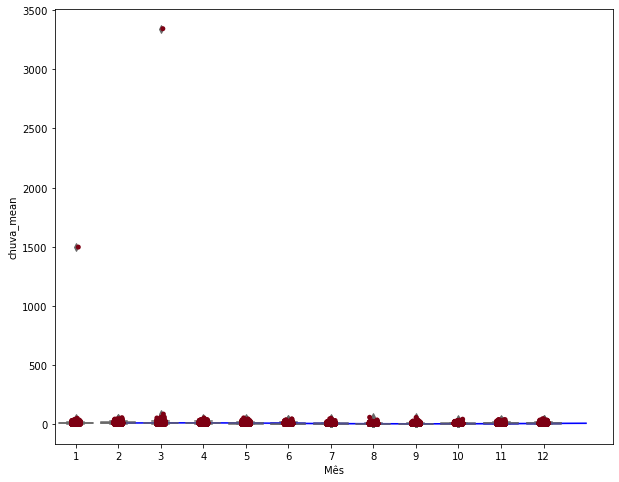

In [66]:
# Gráfico de média de chuvas por ANO, MES, BIOMA
plotbiomames(df_amazonia,"Mês",'chuva_mean')

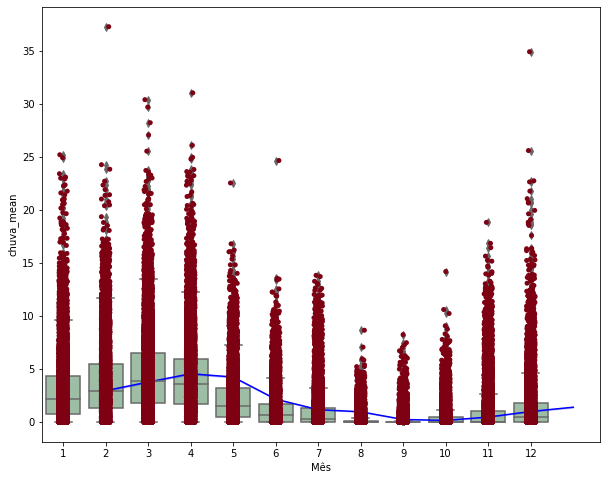

In [67]:

# Média de chuvas por ANO, MES, dia, Todos os biomas
plotbiomames(df_cerrado,"Mês",'chuva_mean')

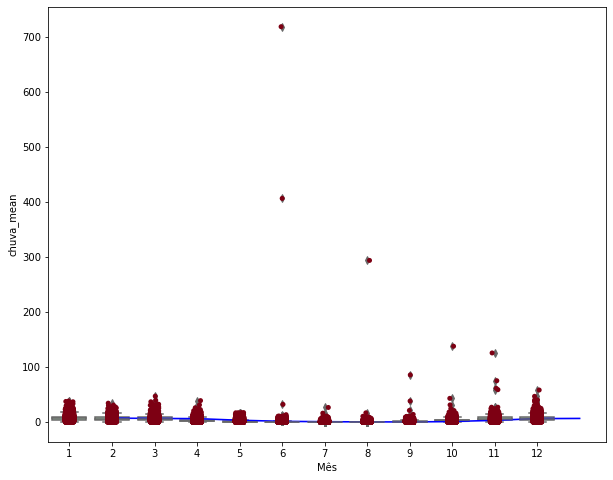

In [70]:
# Gráfico de média de chuvas por ANO, BIOMA
plotbiomames(df_caatinga,"Mês",'chuva_mean')

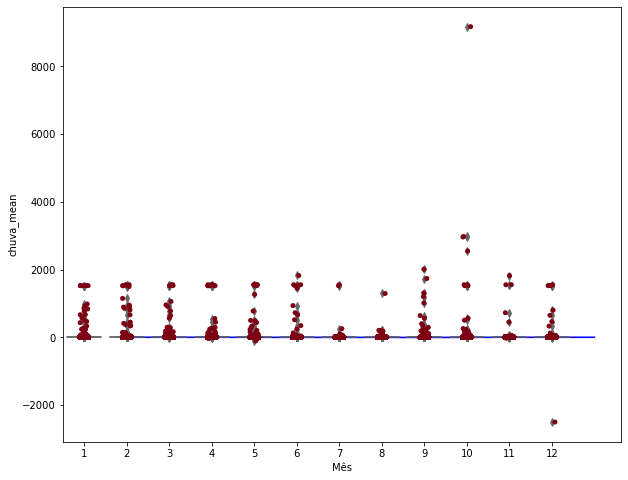

In [71]:
# Gráfico de média de chuvas por ANO, BIOMA
plotbiomames(df_mata_atlantica,"Mês",'chuva_mean')

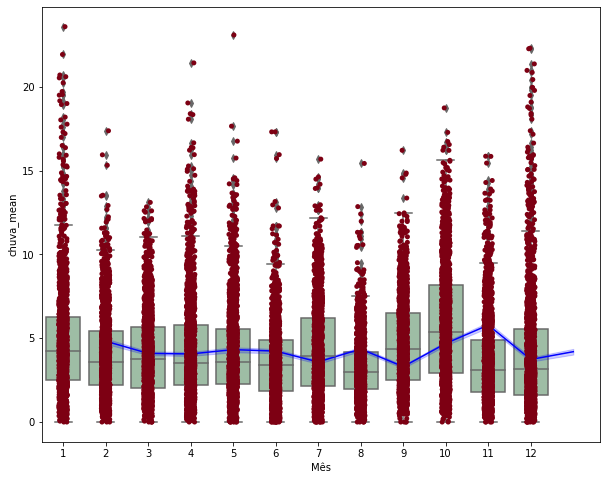

In [72]:
# Gráfico de média de chuvas por ANO, BIOMA
plotbiomames(df_pantanal,"Mês",'chuva_mean')

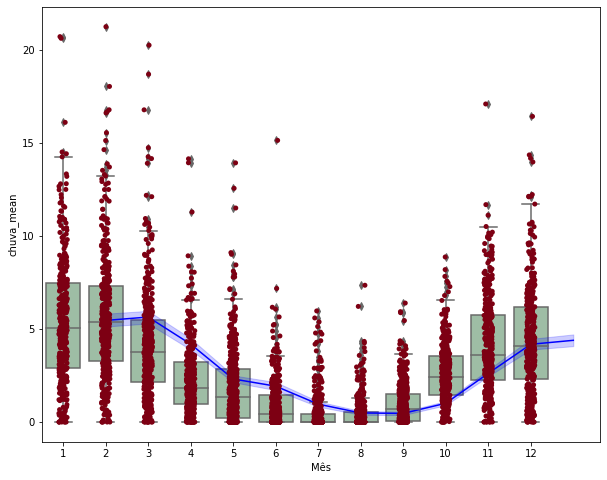

In [73]:
# Gráfico de média de chuvas por ANO, BIOMA
plotbiomames(df_pampa,"Mês",'chuva_mean')

# 4 - Desenvolvimento do Trabalho

### SEGUIR ESTE EXEMPLO

O algoritimo de validação foi retirado deste exemplo

https://egmara-santos.medium.com/utilizando-python-para-verificar-coordenadas-geogr%C3%A1ficas-em-um-mapa-kml-c4d61541e5ce